<a href="https://colab.research.google.com/github/obarnstedt/CEBRA-demos/blob/colab/Demo_hippocampus.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Encoding of space, hippocampus (CA1)

In this notebook, we show how to:

- use CEBRA on the hippocampus data (as shown in Fig. 1, 2).
- use the infoNCE loss with CEBRA.

More specifically, this is a mega-notebook, containing all the informations presented in [Hypothesis-driven analysis](https://cebra.ai/docs/demo_notebooks/Demo_hypothesis_testing.html), [Consistency](https://cebra.ai/docs/demo_notebooks/Demo_consistency.html), [Decoding](https://cebra.ai/docs/demo_notebooks/Demo_decoding.html) and [Topological data analysis](https://cebra.ai/docs/demo_notebooks/Demo_cohomology.html) into a single demo notebook. We recommand that you go through those individual notebooks instead, as they present some of the most recently implemented helper functions for plotting, saving models, etc.

**Install note**

- Be sure you have demo dependencies installed to use this notebook:

In [ ]:
!pip install 'cebra[dev,demos]'

In [2]:
import sys
import os

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from plotly.subplots import make_subplots
import plotly.graph_objects as go

import joblib as jl

import cebra.datasets
from cebra import CEBRA

# check if notebook run in Colab:
try:
  import google.colab
  IN_COLAB = True
  %matplotlib inline
except:
  IN_COLAB = False
  %matplotlib notebook

/usr/local/lib/python3.10/dist-packages/cebra/datasets/monkey_reaching.py:35: UserWarning: Could not import the nlb_tools package required for data loading of cebra.datasets.monkey_reaching. Dataset will not be available. If required, you can install the dataset by running pip install git+https://github.com/neurallatents/nlb_tools.
  warnings.warn(


### Load the data:

- The data will be automatically downloaded into a `/data` folder.

In [ ]:
if IN_COLAB:
    import locale
    locale.getpreferredencoding = lambda: "UTF-8"  # to prevent locale errors
    #for google colab only, run this cell to download and extract data:
    !wget --content-disposition https://figshare.com/ndownloader/files/36869049?private_link=60adb075234c2cc51fa3
    !mkdir data
    !tar -xvf "/content/data.tgz" -C "/content/data"

hippocampus_pos = cebra.datasets.init('rat-hippocampus-single-achilles')

### Visualize the data:

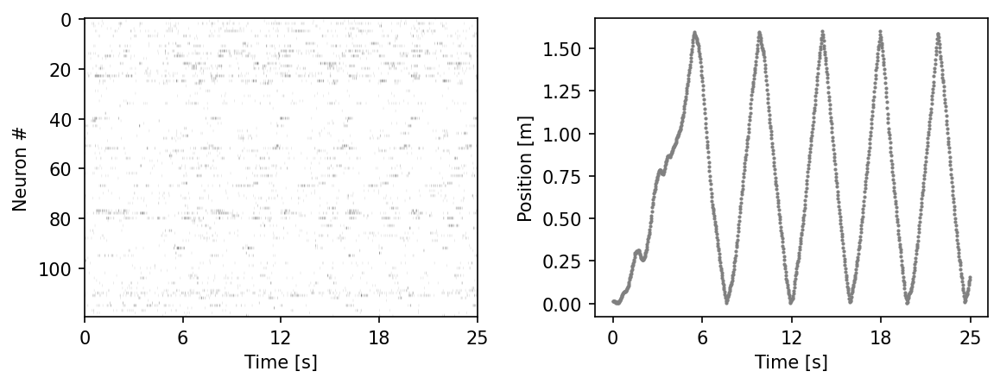

In [6]:
fig = plt.figure(figsize=(9,3), dpi=150)
plt.subplots_adjust(wspace = 0.3)
ax = plt.subplot(121)
ax.imshow(hippocampus_pos.neural.numpy()[:1000].T, aspect = 'auto', cmap = 'gray_r')
plt.ylabel('Neuron #')
plt.xlabel('Time [s]')
plt.xticks(np.linspace(0, 1000, 5), np.linspace(0, 0.025*1000, 5, dtype = int))

ax2 = plt.subplot(122)
ax2.scatter(np.arange(1000), hippocampus_pos.continuous_index[:1000,0], c = 'gray', s=1)
plt.ylabel('Position [m]')
plt.xlabel('Time [s]')
plt.xticks(np.linspace(0, 1000, 5), np.linspace(0, 0.025*1000, 5, dtype = int))
plt.show()

### CEBRA-Behavior: Train a model with 3D output that uses positional information (position + direction).
- Setting conditional = 'time_delta' means we will use CEBRA-Behavior mode and use auxiliary behavior variable for the model training.

- For a quick CPU run-time demo, you can drop `max_iterations` to 100-500; otherwise set to 5000.
- For reproducing Figure 2, we use dimension 3 for the infoNCE loss. You can otherwise set it higher.

In [7]:
max_iterations = 10000 #default is 5000.
output_dimension = 32 #here, we set as a variable for hypothesis testing below.

In [8]:
cebra_posdir3_model = CEBRA(model_architecture='offset10-model',
                        batch_size=512,
                        learning_rate=3e-4,
                        temperature=1,
                        output_dimension=3,
                        max_iterations=max_iterations,
                        distance='cosine',
                        conditional='time_delta',
                        device='cuda_if_available',
                        verbose=True,
                        time_offsets=10)

### We train the model with neural data and the behavior variable including position and direction.

In [9]:
cebra_posdir3_model.fit(hippocampus_pos.neural, hippocampus_pos.continuous_index.numpy())
cebra_posdir3 = cebra_posdir3_model.transform(hippocampus_pos.neural)

pos:  0.1014 neg:  5.4153 total:  5.5167 temperature:  1.0000: 100%|██████████| 10000/10000 [02:11<00:00, 76.17it/s]


### CEBRA-Shuffled Behavior: Train a control model with shuffled neural data.
- The model specification is the same as the CEBRA-Behavior above.

In [10]:
cebra_posdir_shuffled3_model = CEBRA(model_architecture='offset10-model',
                        batch_size=512,
                        learning_rate=3e-4,
                        temperature=1,
                        output_dimension=3,
                        max_iterations=max_iterations,
                        distance='cosine',
                        conditional='time_delta',
                        device='cuda_if_available',
                        verbose=True,
                        time_offsets=10)

- Now we train the model with shuffled behavior variable.

In [11]:
### Shuffle the behavior variable and use it for training
hippocampus_shuffled_posdir = np.random.permutation(hippocampus_pos.continuous_index.numpy())
cebra_posdir_shuffled3_model.fit(hippocampus_pos.neural, hippocampus_shuffled_posdir)
cebra_posdir_shuffled3 = cebra_posdir_shuffled3_model.transform(hippocampus_pos.neural)

pos:  0.3544 neg:  5.7667 total:  6.1210 temperature:  1.0000: 100%|██████████| 10000/10000 [01:57<00:00, 85.47it/s]


### CEBRA-Time: Train a model that uses time without the behavior information.
- We can use CEBRA -Time mode by setting conditional = 'time'

In [12]:
cebra_time3_model = CEBRA(model_architecture='offset10-model',
                        batch_size=512,
                        learning_rate=3e-4,
                        temperature=1.12,
                        output_dimension=3,
                        max_iterations=max_iterations,
                        distance='cosine',
                        conditional='time',
                        device='cuda_if_available',
                        verbose=True,
                        time_offsets=10)

In [13]:
cebra_time3_model.fit(hippocampus_pos.neural)
cebra_time3 = cebra_time3_model.transform(hippocampus_pos.neural)

pos:  0.0247 neg:  5.4770 total:  5.5017 temperature:  1.1200: 100%|██████████| 10000/10000 [01:51<00:00, 89.95it/s]


### CEBRA-Hybrid: Train a model that uses both time and positional information.

In [14]:
cebra_hybrid_model = CEBRA(model_architecture='offset10-model',
                        batch_size=512,
                        learning_rate=3e-4,
                        temperature=1,
                        output_dimension=3,
                        max_iterations=max_iterations,
                        distance='cosine',
                        conditional='time_delta',
                        device='cuda_if_available',
                        verbose=True,
                        time_offsets=10,
                        hybrid = True)

In [15]:
cebra_hybrid_model.fit(hippocampus_pos.neural, hippocampus_pos.continuous_index.numpy())
cebra_hybrid = cebra_hybrid_model.transform(hippocampus_pos.neural)

behavior_pos:  0.0979 behavior_neg:  5.4172 behavior_total:  5.5150 time_pos:  0.0767 time_neg:  5.4172 time_total:  5.4939: 100%|██████████| 10000/10000 [03:02<00:00, 54.67it/s]


### Visualize the embeddings from CEBRA-Behavior, CEBRA-Time and CEBRA-Hybrid

In [16]:
def plot_hippocampus(ax, embedding, label, gray = False, idx_order = (0,1,2)):
    r_ind = label[:,1] == 1
    l_ind = label[:,2] == 1

    if not gray:
        r_cmap = 'cool'
        l_cmap = 'viridis'
        r_c = label[r_ind, 0]
        l_c = label[l_ind, 0]
    else:
        r_cmap = None
        l_cmap = None
        r_c = 'gray'
        l_c = 'gray'

    idx1, idx2, idx3 = idx_order
    r=ax.scatter(embedding [r_ind,idx1],
               embedding [r_ind,idx2],
               embedding [r_ind,idx3],
               c=r_c,
               cmap=r_cmap, s=0.5)
    l=ax.scatter(embedding [l_ind,idx1],
               embedding [l_ind,idx2],
               embedding [l_ind,idx3],
               c=l_c,
               cmap=l_cmap, s=0.5)

    ax.grid(False)
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False
    ax.xaxis.pane.set_edgecolor('w')
    ax.yaxis.pane.set_edgecolor('w')
    ax.zaxis.pane.set_edgecolor('w')

    return ax

def plot_hippocampus_plotly(fig, col, embedding, label, row=0, gray=False, idx_order=(0,1,2)):
    r_ind = label[:,1] == 1
    l_ind = label[:,2] == 1

    if not gray:
        # r_cmap = 'Plotly3'  # 'cool' does not exist in plotly
        r_cmap = ["#00fdff", "#ff40ff"]
        l_cmap = 'viridis'
        r_c = label[r_ind, 0]
        l_c = label[l_ind, 0]
    else:
        r_cmap = None
        l_cmap = None
        r_c = 'gray'
        l_c = 'gray'

    idx1, idx2, idx3 = idx_order

    fig.add_trace(
        go.Scatter3d(
            x=embedding[r_ind, idx1],
            y=embedding[r_ind, idx2],
            z=embedding[r_ind, idx3],
            mode='markers',
            marker=dict(
                size=2,
                opacity=0.6,
                color=r_c,   # set color to an array/list of desired values
                colorscale=r_cmap,   # choose a colorscale
                line=dict(width=0)
            ),
        ), col=col+1, row=row+1)

    fig.add_trace(
        go.Scatter3d(
            x=embedding[l_ind, idx1],
            y=embedding[l_ind, idx2],
            z=embedding[l_ind, idx3],
            mode='markers',
            marker=dict(
                size=2,
                opacity=0.6,
                color=l_c,   # set color to an array/list of desired values
                colorscale=l_cmap,   # choose a colorscale
                line=dict(width=0)
            ),
        ), col=col+1, row=row+1)

    return fig

In [17]:
plotly = True
if plotly:
    fig = make_subplots(rows=1, cols=4,
                        specs=[[{'is_3d': True}]*4],
                        print_grid=False,
                        subplot_titles=(['CEBRA-Behavior', 'CEBRA-Shuffled',
                                        'CEBRA-Time', 'CEBRA-Hybrid']),
                        horizontal_spacing = 0.05,
    )
    ax1 = plot_hippocampus_plotly(fig, 0, cebra_posdir3, hippocampus_pos.continuous_index)
    ax2 = plot_hippocampus_plotly(fig, 1, cebra_posdir_shuffled3, hippocampus_pos.continuous_index)
    ax3 = plot_hippocampus_plotly(fig, 2, cebra_time3, hippocampus_pos.continuous_index)
    ax4 = plot_hippocampus_plotly(fig, 3, cebra_hybrid, hippocampus_pos.continuous_index)
    fig.update_layout(template="plotly_white", showlegend=False, height=400)
    fig.show()

else:
    fig = plt.figure(figsize=(10,2))

    ax1 = plt.subplot(141, projection='3d')
    ax2 = plt.subplot(142, projection='3d')
    ax3 = plt.subplot(143, projection='3d')
    ax4 = plt.subplot(144, projection='3d')

    ax1=plot_hippocampus(ax1, cebra_posdir3, hippocampus_pos.continuous_index)
    ax2=plot_hippocampus(ax2, cebra_posdir_shuffled3, hippocampus_pos.continuous_index)
    ax3=plot_hippocampus(ax3, cebra_time3, hippocampus_pos.continuous_index)
    ax4=plot_hippocampus(ax4, cebra_hybrid, hippocampus_pos.continuous_index)

    ax1.set_title('CEBRA-Behavior')
    ax2.set_title('CEBRA-Shuffled')
    ax3.set_title('CEBRA-Time')
    ax4.set_title('CEBRA-Hybrid')
    plt.show()

### Hypothesis Testing: Train models with different hypothesis on position encoding of hippocampus.
- We will compare CEBRA-Behavior models trained with only position, only direction, both and the control models with shuffled behavior variables.

- Here, we use the set model dimension; in the paper we used 3-64 on the hippocampus data (and found a consistent topology across these dimensions).

- For the purpose of decoding later, we will use a splitted data (80% train, 20% test) and only use train set to train the models.

In [18]:
def split_data(data, test_ratio):

    split_idx = int(len(data)* (1-test_ratio))
    neural_train = data.neural[:split_idx]
    neural_test = data.neural[split_idx:]
    label_train = data.continuous_index[:split_idx]
    label_test = data.continuous_index[split_idx:]

    return neural_train.numpy(), neural_test.numpy(), label_train.numpy(), label_test.numpy()

neural_train, neural_test, label_train, label_test = split_data(hippocampus_pos, 0.2)

In [19]:
cebra_posdir_model = CEBRA(model_architecture='offset10-model',
                        batch_size=512,
                        learning_rate=3e-4,
                        temperature=1,
                        output_dimension=output_dimension,
                        max_iterations=max_iterations,
                        distance='cosine',
                        conditional='time_delta',
                        device='cuda_if_available',
                        verbose=True,
                        time_offsets=10)

cebra_pos_model = CEBRA(model_architecture='offset10-model',
                        batch_size=512,
                        learning_rate=3e-4,
                        temperature=1,
                        output_dimension=output_dimension,
                        max_iterations=max_iterations,
                        distance='cosine',
                        conditional='time_delta',
                        device='cuda_if_available',
                        verbose=True,
                        time_offsets=10)

cebra_dir_model = CEBRA(model_architecture='offset10-model',
                        batch_size=512,
                        learning_rate=3e-4,
                        temperature=1,
                        output_dimension=output_dimension,
                        max_iterations=max_iterations,
                        distance='cosine',
                        device='cuda_if_available',
                        verbose=True)

In [20]:
# Train CEBRA-Behavior models with position, direction variable or both.
# We get train set embedding and test set embedding.

cebra_posdir_model.fit(neural_train, label_train)
cebra_posdir_train = cebra_posdir_model.transform(neural_train)
cebra_posdir_test = cebra_posdir_model.transform(neural_test)

cebra_pos_model.fit(neural_train, label_train[:,0])
cebra_pos_train = cebra_pos_model.transform(neural_train)
cebra_pos_test = cebra_pos_model.transform(neural_test)

cebra_dir_model.fit(neural_train, label_train[:,1])
cebra_dir_train = cebra_dir_model.transform(neural_train)
cebra_dir_test = cebra_dir_model.transform(neural_test)

pos:  0.1079 neg:  5.3965 total:  5.5044 temperature:  1.0000: 100%|██████████| 10000/10000 [01:56<00:00, 86.11it/s]
pos:  0.1178 neg:  5.4871 total:  5.6049 temperature:  1.0000: 100%|██████████| 10000/10000 [01:57<00:00, 85.35it/s]
pos:  0.0636 neg:  5.5845 total:  5.6480 temperature:  1.0000: 100%|██████████| 10000/10000 [01:56<00:00, 85.57it/s]


### Train control models with shuffled behavior variables.

In [21]:
cebra_posdir_shuffled_model = CEBRA(model_architecture='offset10-model',
                        batch_size=512,
                        learning_rate=3e-4,
                        temperature=1,
                        output_dimension=output_dimension,
                        max_iterations=max_iterations,
                        distance='cosine',
                        conditional='time_delta',
                        device='cuda_if_available',
                        verbose=True,
                        time_offsets=10)

cebra_pos_shuffled_model = CEBRA(model_architecture='offset10-model',
                        batch_size=512,
                        learning_rate=3e-4,
                        temperature=1,
                        output_dimension=output_dimension,
                        max_iterations=max_iterations,
                        distance='cosine',
                        conditional='time_delta',
                        device='cuda_if_available',
                        verbose=True,
                        time_offsets=10)

cebra_dir_shuffled_model = CEBRA(model_architecture='offset10-model',
                        batch_size=512,
                        learning_rate=3e-4,
                        temperature=1,
                        output_dimension=output_dimension,
                        max_iterations=max_iterations,
                        distance='cosine',
                        device='cuda_if_available',
                        verbose=True)

In [22]:
# Generate shuffled behavior labels for train set.
shuffled_posdir = np.random.permutation(label_train)
shuffled_pos = np.random.permutation(label_train[:,0])
shuffled_dir = np.random.permutation(label_train[:,1])

# Train the models with shuffled behavior variables and get train/test embeddings
cebra_posdir_shuffled_model.fit(neural_train, shuffled_posdir)
cebra_posdir_shuffled_train = cebra_posdir_shuffled_model.transform(neural_train)
cebra_posdir_shuffled_test = cebra_posdir_shuffled_model.transform(neural_test)

cebra_pos_shuffled_model.fit(neural_train, shuffled_pos)
cebra_pos_shuffled_train = cebra_pos_shuffled_model.transform(neural_train)
cebra_pos_shuffled_test = cebra_pos_shuffled_model.transform(neural_test)

cebra_dir_shuffled_model.fit(neural_train, shuffled_dir)
cebra_dir_shuffled_train = cebra_dir_shuffled_model.transform(neural_train)
cebra_dir_shuffled_test = cebra_dir_shuffled_model.transform(neural_test)

pos:  0.2704 neg:  5.8484 total:  6.1187 temperature:  1.0000: 100%|██████████| 10000/10000 [01:55<00:00, 86.78it/s]
pos:  0.2783 neg:  5.8461 total:  6.1244 temperature:  1.0000: 100%|██████████| 10000/10000 [01:54<00:00, 87.15it/s]
pos:  0.1878 neg:  5.8144 total:  6.0022 temperature:  1.0000: 100%|██████████| 10000/10000 [01:55<00:00, 86.66it/s]


### Visualize embeddings from different hypothesis

In [23]:
cebra_pos_all = cebra_pos_model.transform(hippocampus_pos.neural)
cebra_dir_all = cebra_dir_model.transform(hippocampus_pos.neural)
cebra_posdir_all = cebra_posdir_model.transform(hippocampus_pos.neural)

cebra_pos_shuffled_all = cebra_pos_shuffled_model.transform(hippocampus_pos.neural)
cebra_dir_shuffled_all = cebra_dir_shuffled_model.transform(hippocampus_pos.neural)
cebra_posdir_shuffled_all = cebra_posdir_shuffled_model.transform(hippocampus_pos.neural)

In [24]:
plotly = True
if plotly:
    fig = make_subplots(rows=2, cols=3,
                        specs=[[{'is_3d': True}]*3, [{'is_3d': True}]*3],
                        print_grid=False,
                        subplot_titles=(['position only',
                                         'direction only',
                                         'position+direction',
                                         'position, shuffled',
                                         'direction, shuffled',
                                         'pos+dir, shuffled']),
                        horizontal_spacing = 0.05, vertical_spacing = 0.05,
    )
    ax1 = plot_hippocampus_plotly(fig, 0, cebra_pos_all,
                                  hippocampus_pos.continuous_index, gray=True)
    ax2 = plot_hippocampus_plotly(fig, 1, cebra_dir_all,
                                  hippocampus_pos.continuous_index, gray=True)
    ax3 = plot_hippocampus_plotly(fig, 2, cebra_posdir_all,
                                  hippocampus_pos.continuous_index, gray=True)
    ax4 = plot_hippocampus_plotly(fig, 0, cebra_pos_shuffled_all,
                                  hippocampus_pos.continuous_index, row=1, gray=True)
    ax5 = plot_hippocampus_plotly(fig, 1, cebra_dir_shuffled_all,
                                  hippocampus_pos.continuous_index, row=1, gray=True)
    ax6 = plot_hippocampus_plotly(fig, 2, cebra_posdir_shuffled_all,
                                  hippocampus_pos.continuous_index, row=1, gray=True)
    fig.update_layout(template="plotly_white", showlegend=False, height=800)
    fig.show()

else:

    fig=plt.figure(figsize=(9,6))
    ax1=plt.subplot(231, projection = '3d')
    ax2=plt.subplot(232, projection = '3d')
    ax3=plt.subplot(233, projection = '3d')
    ax4=plt.subplot(234, projection = '3d')
    ax5=plt.subplot(235, projection = '3d')
    ax6=plt.subplot(236, projection = '3d')

    ax1=plot_hippocampus(ax1, cebra_pos_all, hippocampus_pos.continuous_index, gray=True)
    ax2=plot_hippocampus(ax2, cebra_dir_all, hippocampus_pos.continuous_index, gray=True)
    ax3=plot_hippocampus(ax3, cebra_posdir_all,hippocampus_pos.continuous_index, gray=True)
    ax4=plot_hippocampus(ax4, cebra_pos_shuffled_all, hippocampus_pos.continuous_index, gray=True)
    ax5=plot_hippocampus(ax5, cebra_dir_shuffled_all, hippocampus_pos.continuous_index, gray=True)
    ax6=plot_hippocampus(ax6, cebra_posdir_shuffled_all, hippocampus_pos.continuous_index, gray=True)

    ax1.set_title('position only')
    ax2.set_title('direction only')
    ax3.set_title('position+direction')
    ax4.set_title('position, shuffled')
    ax5.set_title('direction, shuffled')
    ax6.set_title('pos+dir, shuffled')

    def ax_lim(ax):
        ax.set_xlim(-1,1)
        ax.set_ylim(-1,1)
        ax.set_zlim(-1,1)

    plt.show()

### Visualize the loss of models trained with different hypothesis

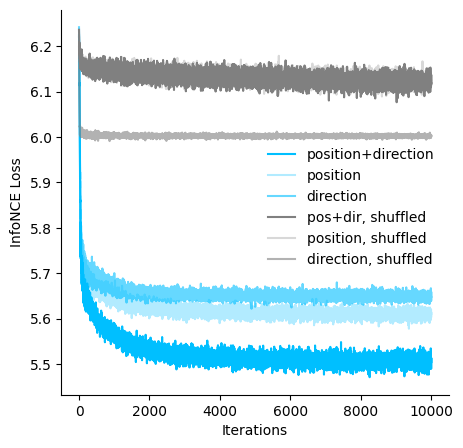

In [25]:
fig = plt.figure(figsize=(5,5))
ax = plt.subplot(111)
ax.plot(cebra_posdir_model.state_dict_['loss'], c='deepskyblue', label = 'position+direction')
ax.plot(cebra_pos_model.state_dict_['loss'], c='deepskyblue', alpha = 0.3, label = 'position')
ax.plot(cebra_dir_model.state_dict_['loss'], c='deepskyblue', alpha=0.6,label = 'direction')
ax.plot(cebra_posdir_shuffled_model.state_dict_['loss'], c='gray', label = 'pos+dir, shuffled')
ax.plot(cebra_pos_shuffled_model.state_dict_['loss'], c='gray', alpha = 0.3, label = 'position, shuffled')
ax.plot(cebra_dir_shuffled_model.state_dict_['loss'],c='gray', alpha=0.6,label = 'direction, shuffled')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel('Iterations')
ax.set_ylabel('InfoNCE Loss')
plt.legend(bbox_to_anchor=(0.5,0.3), frameon = False )
plt.show()

### Decoding: we evaluate decoding performance of the different hypothesis models.

In [26]:
# Define decoding function with kNN decoder. For a simple demo, we will use the fixed number of neighbors 36.

from sklearn.neighbors import KNeighborsRegressor, KNeighborsClassifier
import sklearn.metrics

def decoding_pos_dir(emb_train, emb_test, label_train, label_test, n_neighbors=36):
    pos_decoder = KNeighborsRegressor(n_neighbors, metric = 'cosine')
    dir_decoder = KNeighborsClassifier(n_neighbors, metric = 'cosine')

    pos_decoder.fit(emb_train, label_train[:,0])
    dir_decoder.fit(emb_train, label_train[:,1])

    pos_pred = pos_decoder.predict(emb_test)
    dir_pred = dir_decoder.predict(emb_test)

    prediction =np.stack([pos_pred, dir_pred],axis = 1)

    test_score = sklearn.metrics.r2_score(label_test[:,:2], prediction)
    pos_test_err = np.median(abs(prediction[:,0] - label_test[:, 0]))
    pos_test_score = sklearn.metrics.r2_score(label_test[:, 0], prediction[:,0])

    return test_score, pos_test_err, pos_test_score

- Decode the position and direction from the trained hypothesis models

In [27]:
cebra_posdir_decode = decoding_pos_dir(cebra_posdir_train, cebra_posdir_test, label_train, label_test)
cebra_pos_decode = decoding_pos_dir(cebra_pos_train, cebra_pos_test, label_train, label_test)
cebra_dir_decode = decoding_pos_dir(cebra_dir_train, cebra_dir_test, label_train, label_test)
cebra_posdir_shuffled_decode = decoding_pos_dir(cebra_posdir_shuffled_train, cebra_posdir_shuffled_test, label_train, label_test)
cebra_pos_shuffled_decode = decoding_pos_dir(cebra_pos_shuffled_train, cebra_pos_shuffled_test, label_train, label_test)
cebra_dir_shuffled_decode = decoding_pos_dir(cebra_dir_shuffled_train, cebra_dir_shuffled_test, label_train, label_test)


### Visualize the decoding results and loss - decoding performance

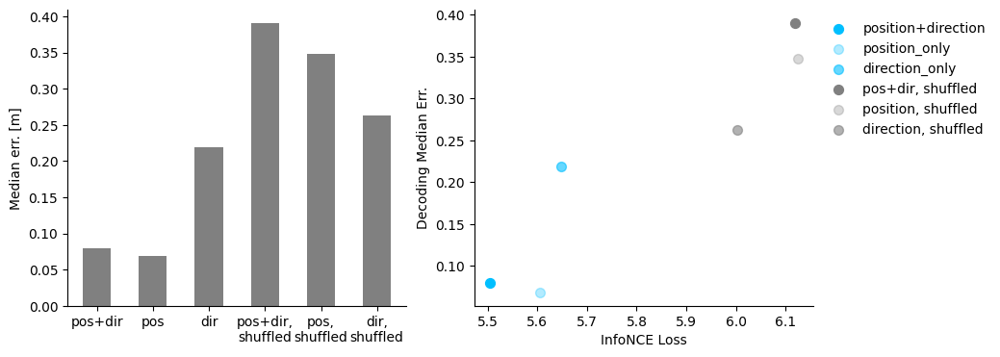

In [28]:
fig = plt.figure(figsize=(10,4))
ax1= plt.subplot(121)
ax1.bar(np.arange(6),
        [cebra_posdir_decode[1], cebra_pos_decode[1], cebra_dir_decode[1],
         cebra_posdir_shuffled_decode[1], cebra_pos_shuffled_decode[1], cebra_dir_shuffled_decode[1]],
         width = 0.5, color = 'gray')
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.set_xticks(np.arange(6))
ax1.set_xticklabels(['pos+dir', 'pos', 'dir', 'pos+dir,\nshuffled', 'pos,\nshuffled', 'dir,\nshuffled'])
ax1.set_ylabel('Median err. [m]')

ax2 = plt.subplot(122)
ax2.scatter(cebra_posdir_model.state_dict_['loss'][-1],cebra_posdir_decode[1], s=50, c='deepskyblue', label = 'position+direction')
ax2.scatter(cebra_pos_model.state_dict_['loss'][-1],cebra_pos_decode[1], s=50, c='deepskyblue', alpha = 0.3, label = 'position_only')
ax2.scatter(cebra_dir_model.state_dict_['loss'][-1],cebra_dir_decode[1], s=50, c='deepskyblue', alpha=0.6,label = 'direction_only')
ax2.scatter(cebra_posdir_shuffled_model.state_dict_['loss'][-1],cebra_posdir_shuffled_decode[1], s=50, c='gray', label = 'pos+dir, shuffled')
ax2.scatter(cebra_pos_shuffled_model.state_dict_['loss'][-1],cebra_pos_shuffled_decode[1], s=50, c='gray', alpha = 0.3, label = 'position, shuffled')
ax2.scatter(cebra_dir_shuffled_model.state_dict_['loss'][-1],cebra_dir_shuffled_decode[1], s=50, c='gray', alpha=0.6,label = 'direction, shuffled')

ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.set_xlabel('InfoNCE Loss')
ax2.set_ylabel('Decoding Median Err.')
plt.legend(bbox_to_anchor=(1,1), frameon = False )
plt.show()

## Persistent cohomology analysis with CEBRA embeddings of varying output dimensions:

### Train additional CEBRA-Behavior with dimensions 8, 16

In [29]:
cebra_posdir8_model= CEBRA(model_architecture='offset10-model',
                        batch_size=512,
                        learning_rate=3e-4,
                        temperature=1,
                        output_dimension=8,
                        max_iterations=max_iterations,
                        distance='cosine',
                        conditional='time_delta',
                        device='cuda_if_available',
                        verbose=True,
                        time_offsets=10)
cebra_posdir16_model = CEBRA(model_architecture='offset10-model',
                        batch_size=512,
                        learning_rate=3e-4,
                        temperature=1,
                        output_dimension=16,
                        max_iterations=max_iterations,
                        distance='cosine',
                        conditional='time_delta',
                        device='cuda_if_available',
                        verbose=True,
                        time_offsets=10)

In [30]:
cebra_posdir8_model.fit(hippocampus_pos.neural, hippocampus_pos.continuous_index.numpy())
cebra_posdir8 = cebra_posdir8_model.transform(hippocampus_pos.neural)

cebra_posdir16_model.fit(hippocampus_pos.neural, hippocampus_pos.continuous_index.numpy())
cebra_posdir16 = cebra_posdir16_model.transform(hippocampus_pos.neural)


pos:  0.1034 neg:  5.3937 total:  5.4971 temperature:  1.0000: 100%|██████████| 10000/10000 [01:53<00:00, 87.76it/s]
pos:  0.1151 neg:  5.3895 total:  5.5046 temperature:  1.0000: 100%|██████████| 10000/10000 [01:54<00:00, 87.45it/s]


### Plotting the results:


In [31]:
if plotly:
    fig = make_subplots(rows=1, cols=3,
                        specs=[[{'is_3d': True}]*3],
                        print_grid=False,
                        subplot_titles=(['CEBRA-Dim 3', 'CEBRA-Dim 8',
                                        'CEBRA-Dim 16']),
                        horizontal_spacing = 0.05, vertical_spacing = 0.05,
    )
    ax1 = plot_hippocampus_plotly(fig, 0, cebra_posdir3, hippocampus_pos.continuous_index)
    ax2 = plot_hippocampus_plotly(fig, 1, cebra_posdir8, hippocampus_pos.continuous_index)
    ax3 = plot_hippocampus_plotly(fig, 2, cebra_posdir16, hippocampus_pos.continuous_index)
    fig.update_layout(template="plotly_white", showlegend=False, height=500)
    fig.show()

else:
    fig = plt.figure(figsize = (10,3), dpi = 100)

    ax1 = plt.subplot(131,projection='3d')
    ax2 = plt.subplot(132, projection = '3d')
    ax3 = plt.subplot(133, projection = '3d')

    ax1=plot_hippocampus(ax1, cebra_posdir3, hippocampus_pos.continuous_index)
    ax2=plot_hippocampus(ax2, cebra_posdir8, hippocampus_pos.continuous_index)
    ax3=plot_hippocampus(ax3, cebra_posdir16, hippocampus_pos.continuous_index)

    ax1.set_title('CEBRA-Dim 3')
    ax2.set_title('CEBRA-Dim 8')
    ax3.set_title('CEBRA-Dim 16')
    plt.show()

## Topological Data Analysis:

### Get random 1000 points of embeddings and do persistent cohomology analysis upto H1

- note this requires the ripser package.
- If you previously installed DREiMac (such as running this notebook before, there are some dependency clashes with ripser, so you need to uninstall it first, and reinstall risper:

In [32]:
!pip uninstall -y dreimac
!pip uninstall -y cebra
!pip uninstall -y ripser

Found existing installation: cebra 0.2.0
Uninstalling cebra-0.2.0:
  Successfully uninstalled cebra-0.2.0


In [33]:
!pip install ripser
#Depending on your system, this can cause errors.
#Thus if issues please follow these instructions directly: https://pypi.org/project/ripser/
import ripser

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.6/74.6 kB 2.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.0/48.0 kB 4.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for ripser: filename=ripser-0.6.4-cp310-cp310-linux_x86_64.whl size=754194 sha256=fc52a5c7344b16290e59b6d23605d4dbbb6f93a2bd3eaeb302e1f78e8d38679d
  Stored in directory: /root/.cache/pip/wheels/c5/f5/66/f41f708b049057431155934f74e20ca6001a085fcd2e615150
  Created wheel for hopcroftkarp: filename=hopcroftkarp-1.2.5-py2.py3-none-any.whl size=18102 sha256=220a45cfe21673ebbf4c8a9563642f72725ff72643c9dc8f5475c38f27b1359a
  Stored in directory: /root/.cache/pip/wheels/ef/0f/3b/0f931844eecc34addd90e72d54cd39c08b7066c5f25c00b9a4
Successfully built ripser hopcroftkarp


- if you get the error `ValueError: numpy.ndarray size changed, may indicate binary incompatibility. Expected 96 from C header, got 80 from PyObject`, please delete the folders from DREiMac and run the cell above again.

In [34]:
maxdim=1 ## Set to 2 to compute upto H2. The computing time is considerably longer. For quick demo upto H1, set it to 1.
np.random.seed(111)
random_idx=np.random.permutation(np.arange(len(cebra_posdir3)))[:1000]
topology_dimension = {}
for embedding in [cebra_posdir3, cebra_posdir8, cebra_posdir16]:
    ripser_output=ripser.ripser(embedding[random_idx], maxdim=maxdim, coeff=47)
    dimension = embedding.shape[1]
    topology_dimension[dimension] = ripser_output

### If you want to visualize the pre-computed persistent co-homology result:

- preloading saves quite a bit of time; to adapt to your own datasets please set topology_dimension and random_inx.

In [35]:
if IN_COLAB:
    !wget -P /content/data https://github.com/AdaptiveMotorControlLab/CEBRA-demos/raw/main/rat_demo_example_output.h5
    CURRENT_DIR = '/content/data'
preload=pd.read_hdf(os.path.join(CURRENT_DIR,'rat_demo_example_output.h5'))
topology_dimension = preload['topology']
topology_random_dimension = preload['topology_random']
random_idx = preload['embedding']['random_idx']
maxdim=2

--2023-09-16 13:12:40--  https://github.com/AdaptiveMotorControlLab/CEBRA-demos/raw/main/rat_demo_example_output.h5
Resolving github.com (github.com)... 140.82.113.3
Connecting to github.com (github.com)|140.82.113.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/AdaptiveMotorControlLab/CEBRA-demos/main/rat_demo_example_output.h5 [following]
--2023-09-16 13:12:41--  https://raw.githubusercontent.com/AdaptiveMotorControlLab/CEBRA-demos/main/rat_demo_example_output.h5
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 76053112 (73M) [application/octet-stream]
Saving to: ‘/content/data/rat_demo_example_output.h5’

rat_demo_example_ou 100%[===================>]  72.53M   142MB/s    in 0.5s    

2023-

In [36]:
def plot_barcode(topology_result, maxdim):
    fig, axs = plt.subplots(maxdim+1, 1, sharex=True, figsize=(7, 8))
    axs[0].set_xlim(0,2)
    cocycle = ["Points", "Loops", "Voids"]
    for k in range(maxdim+1):
        bars = topology_result['dgms'][k]
        bars[bars == np.inf] = 10
        lc = (
            np.vstack(
                [
                    bars[:, 0],
                    np.arange(len(bars), dtype=int) * 6,
                    bars[:, 1],
                    np.arange(len(bars), dtype=int) * 6,
                ]
            )
            .swapaxes(1, 0)
            .reshape(-1, 2, 2)
        )
        line_segments = LineCollection(lc, linewidth=5, color="gray", alpha=0.5)
        axs[k].set_ylabel(cocycle[k], fontsize=20)
        if k == 0:
            axs[k].set_ylim(len(bars) * 6 - 120, len(bars) * 6)
        elif k == 1:
            axs[k].set_ylim(0, len(bars) * 1 - 30)
        elif k == 2:
            axs[k].set_ylim(0, len(bars) * 6 + 10)
        axs[k].add_collection(line_segments)
        axs[k].set_yticks([])
        if k == 2:
            axs[k].set_xticks(np.linspace(0, 2, 3), np
                              .linspace(0, 2, 3), fontsize=15)
            axs[k].set_xlabel("Lifespan", fontsize=20)

    return fig

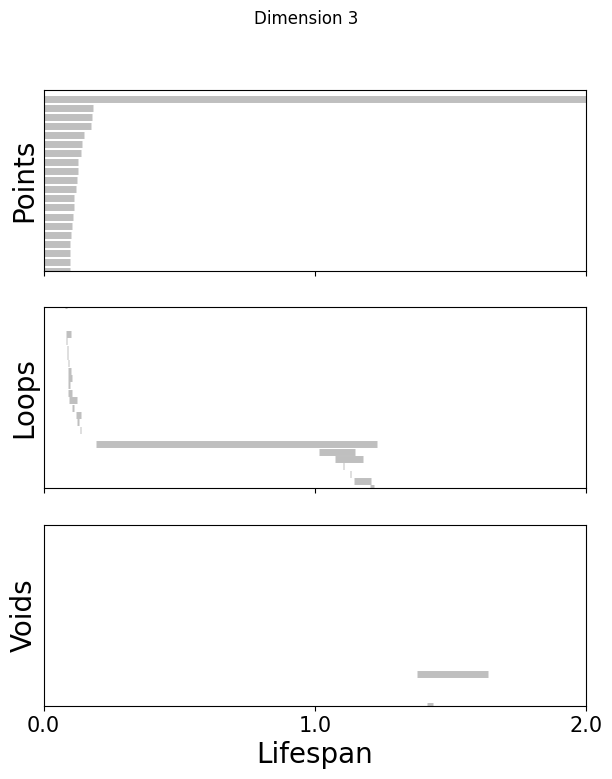

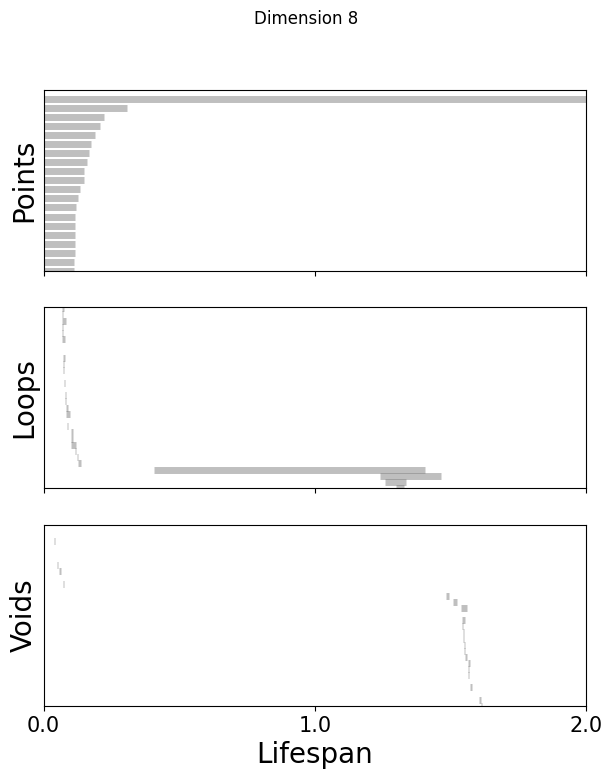

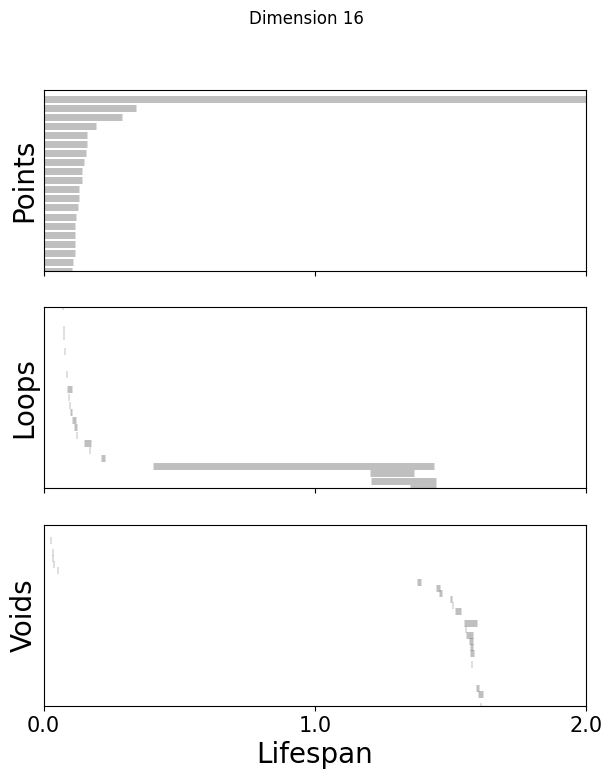

In [37]:
for k in [3,8,16]:
    fig=plot_barcode(topology_dimension[k], maxdim)
    fig.suptitle(f'Dimension {k}')

In [38]:
from persim import plot_diagrams

def read_lifespan(ripser_output, dim):
    dim_diff = ripser_output['dgms'][dim][:, 1] - ripser_output['dgms'][dim][:, 0]
    if dim == 0:
        return dim_diff[~np.isinf(dim_diff)]
    else:
        return dim_diff

def get_max_lifespan(ripser_output_list, maxdim):
    lifespan_dic = {i: [] for i in range(maxdim+1)}
    for f in ripser_output_list:
        for dim in range(maxdim+1):
            lifespan = read_lifespan(f, dim)
            lifespan_dic[dim].extend(lifespan)
    return [max(lifespan_dic[i]) for i in range(maxdim+1)], lifespan_dic

def get_betti_number(ripser_output, shuffled_max_lifespan):
    bettis=[]
    for dim in range(len(ripser_output['dgms'])):
        lifespans=ripser_output['dgms'][dim][:, 1] - ripser_output['dgms'][dim][:, 0]
        betti_d = sum(lifespans > shuffled_max_lifespan[dim] * 1.1)
        bettis.append(betti_d)
    return bettis
def plot_lifespan(topology_dgms, shuffled_max_lifespan, ax, label_vis, maxdim):
    plot_diagrams(
        topology_dgms,
        ax=ax,
        legend=True,
    )

    ax.plot(
        [
            -0.5,
            2,
        ],
        [-0.5 + shuffled_max_lifespan[0], 2 + shuffled_max_lifespan[0]],
        color="C0",
        linewidth=3,
        alpha=0.5,

    )
    ax.plot(
        [
            -0.5,
            2,
        ],
        [-0.5 + shuffled_max_lifespan[1], 2 + shuffled_max_lifespan[1]],
        color="orange",
        linewidth=3,
        alpha=0.5,

    )
    if maxdim == 2:
        ax.plot(
            [-0.50, 2],
            [-0.5 + shuffled_max_lifespan[2], 2 + shuffled_max_lifespan[2]],
            color="green",
            linewidth=3,
            alpha=0.5,
        )
    ax.set_xlabel("Birth", fontsize=15)
    ax.set_xticks([0, 1, 2])
    ax.set_xticklabels([0, 1, 2])
    ax.tick_params(labelsize=13)
    if label_vis:
        ax.set_ylabel("Death", fontsize=15)
    else:
        ax.set_ylabel("")



Betti No. for dimension 3: [1, 1, 0]
Betti No. for dimension 8: [1, 1, 0]
Betti No. for dimension 16: [1, 1, 0]


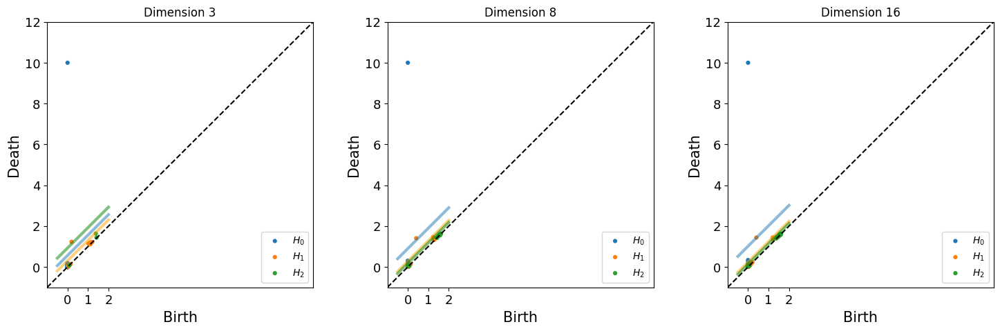

In [39]:
fig = plt.figure(figsize=(18,5))
for n, dim in enumerate([3,8,16]):
    shuffled_max_lifespan, lifespan_dic = get_max_lifespan(topology_random_dimension[dim], maxdim)
    ax = fig.add_subplot(1,3,n+1)
    ax.set_title(f'Dimension {dim}')
    plot_lifespan(topology_dimension[dim]['dgms'], shuffled_max_lifespan, ax, True, maxdim)
    print(f"Betti No. for dimension {dim}: {get_betti_number(topology_dimension[dim], shuffled_max_lifespan)}")

### Visualize topology-preserving circular coordinates from the first co-cycle.

- This requires the DREiMac codebase. Here, we show you how to install their package:

In [40]:
!pip install git+https://github.com/ctralie/DREiMac.git@cdd6d02ba53c3597a931db9da478fd198d6ed00f

  Cloning https://github.com/ctralie/DREiMac.git (to revision cdd6d02ba53c3597a931db9da478fd198d6ed00f) to /tmp/pip-req-build-_47drs19
  Running command git clone --filter=blob:none --quiet https://github.com/ctralie/DREiMac.git /tmp/pip-req-build-_47drs19
  Running command git rev-parse -q --verify 'sha^cdd6d02ba53c3597a931db9da478fd198d6ed00f'
  Running command git fetch -q https://github.com/ctralie/DREiMac.git cdd6d02ba53c3597a931db9da478fd198d6ed00f
  Running command git checkout -q cdd6d02ba53c3597a931db9da478fd198d6ed00f
  Resolved https://github.com/ctralie/DREiMac.git to commit cdd6d02ba53c3597a931db9da478fd198d6ed00f
  Preparing metadata (setup.py) ... done
  Created wheel for dreimac: filename=dreimac-0.1-py3-none-any.whl size=28215 sha256=ac1904be0beec02bff6ca68a63021933f7c58cf85bf92e685a9cbe55a1429863
  Stored in directory: /root/.cache/pip/wheels/67/a7/2d/0ad9ffe28fd7e67e376776e94e8209528a3f44508a89728826
Successfully built dreimac


In [41]:
from dreimac import CircularCoords

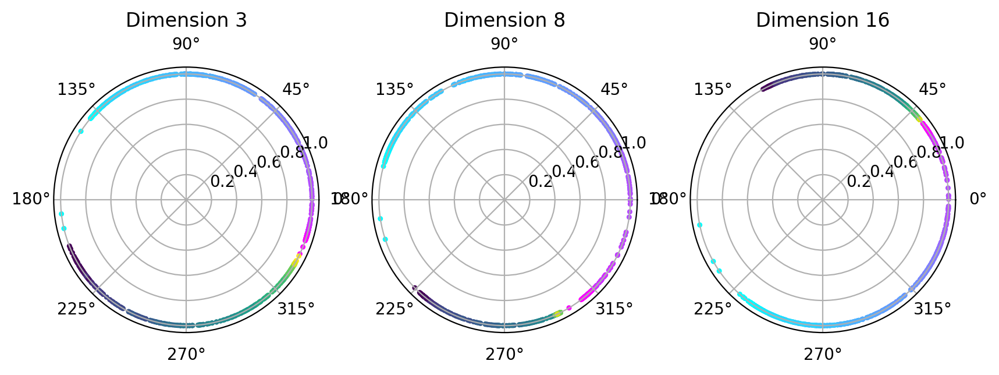

In [42]:
prime = 47
dimension = [3,8,16]
fig, axs = plt.subplots(1, 3, figsize=(10,3), dpi=200, subplot_kw={'projection': 'polar'})
label = hippocampus_pos.continuous_index[random_idx]
r_ind = label[:,1]==1
l_ind = label[:,2]==1
for i, embedding in enumerate([cebra_posdir3, cebra_posdir8, cebra_posdir16]):
    rat_emb=embedding[random_idx]
    cc = CircularCoords(rat_emb, 1000, prime = prime, )
    radial_angle=cc.get_coordinates(cocycle_idx=[0])
    r = np.ones(1000)
    right=axs[i].scatter(radial_angle[r_ind], r[r_ind], s=5, c = label[r_ind,0], cmap = 'cool')
    left=axs[i].scatter(radial_angle[l_ind], r[l_ind], s=5, c = label[l_ind,0], cmap = 'viridis')
    axs[i].set_title(f'Dimension {dimension[i]}')
plt.show()

### Visualize Polar coordinate (radial angle) vs. Position

###### if you want to preload our data, run the following, otherwise skip this cell:

In [43]:
cebra_pos3 = preload['embedding'][3]
cebra_pos8 = preload['embedding'][8]
cebra_pos16 = preload['embedding'][16]

In [44]:
radial_angles = {}
for i, embedding in enumerate([cebra_pos3, cebra_pos8, cebra_pos16]):
    rat_emb=embedding[random_idx]
    cc = CircularCoords(rat_emb, 1000, prime = prime, )
    out=cc.get_coordinates()
    radial_angles[dimension[i]] = out

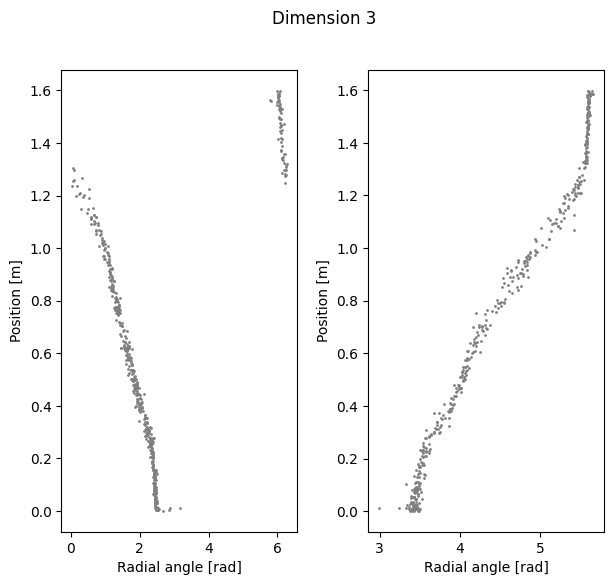

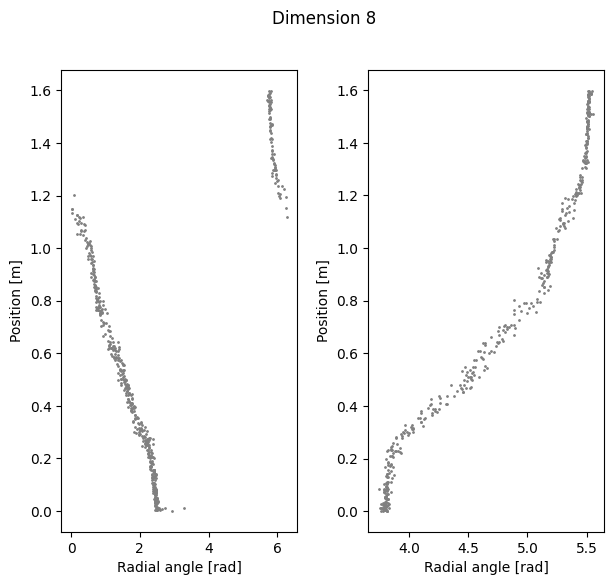

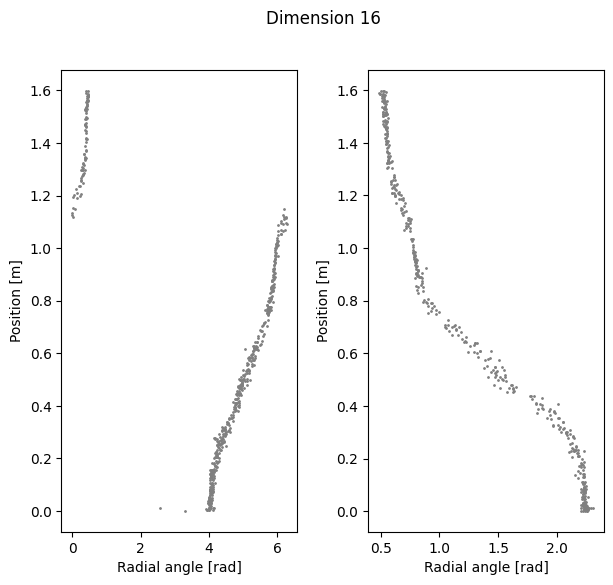

In [45]:
for k in radial_angles.keys():
    fig=plt.figure(figsize=(7,6))
    plt.subplots_adjust(wspace=0.3)
    fig.suptitle(f'Dimension {k}')
    ax1=plt.subplot(121)
    ax1.scatter(radial_angles[k][r_ind], label[r_ind,0], s=1, c = 'gray')
    ax1.set_xlabel('Radial angle [rad]')
    ax1.set_ylabel('Position [m]')
    ax2=plt.subplot(122)
    ax2.scatter(radial_angles[k][l_ind], label[l_ind,0], s=1, c= 'gray')
    ax2.set_xlabel('Radial angle [rad]')
    ax2.set_ylabel('Position [m]')
plt.show()

### Compute linear correlation between computed coordinate and the position

In [46]:
import sklearn.linear_model
def lin_regression(radial_angles, labels):
    def _to_cartesian(radial_angles):
        x = np.cos(radial_angles)
        y = np.sin(radial_angles)
        return np.vstack([x,y]).T
    cartesian = _to_cartesian(radial_angles)
    lin = sklearn.linear_model.LinearRegression()
    lin.fit(cartesian, labels)

    return lin.score(cartesian, labels)

In [47]:
for k in radial_angles.keys():
    print(f'Dimension {k} Cycle angle into position')
    print(f'Right R2: {lin_regression(radial_angles[k][r_ind], label[r_ind,0])}')
    print(f'Left R2: {lin_regression(radial_angles[k][l_ind], label[l_ind,0])}')
    print(f'Total R2: {lin_regression(radial_angles[k], label[:,0])}')

Dimension 3 Cycle angle into position
Right R2: 0.9739516385370737
Left R2: 0.970321213898225
Total R2: 0.9706971877583371
Dimension 8 Cycle angle into position
Right R2: 0.9640045919458425
Left R2: 0.9637490253189099
Total R2: 0.9110782393022603
Dimension 16 Cycle angle into position
Right R2: 0.956975842668472
Left R2: 0.9507297439549257
Total R2: 0.8680615520569934


### Interactive plot to explore co-cycles and circular coordinates.
- Top left panel is a lifespan diagram of persistent co-homology analysis.
- Bottom left panel is a visualization of the first 2 dimensions of the used 1000 embedding points.
- Bottom right panel is a circular coordinate obtained from the co-cycles.
- For more information: https://github.com/ctralie/DREiMac

In [48]:
## change the embedding to use. Here, we look at 3D embedding for posdir3 (position+dir, dim 3):
X=cebra_posdir3[random_idx]

rl_stack=np.vstack([X[r_ind], X[l_ind]])
label_stack = np.vstack([label[r_ind], label[l_ind]])

c1 = plt.get_cmap('cool')
C1 = c1(label[r_ind,0])
c2 = plt.get_cmap('viridis')
C2 = c2(label[l_ind,0])

C = np.vstack([C1,C2])

def plot_circles(ax):
    ax.scatter(rl_stack[:, 0], rl_stack[:, 1], c=C)


cc = CircularCoords(rl_stack, 1000, prime = prime)
cc.plot_torii(C, coords_info=2, plots_in_one=3, lowerleft_plot=plot_circles)


/usr/local/lib/python3.10/dist-packages/dreimac/emcoords.py:66: UserWarning:

Could not accurately determine screen size



<IPython.core.display.Javascript object>